In [26]:
import pyrealsense2 as rs
import numpy as np
import cv2
import os
import time

# Create a directory to save the images
output_folder = "/home/dotronghiep/Documents/Research/Peanuts_Anomaly_Detection_PAD/test_red"
os.makedirs(output_folder, exist_ok=True)

# Configure depth and color streams
pipeline = rs.pipeline()
config = rs.config()

# Get device product line for setting a supporting resolution
pipeline_wrapper = rs.pipeline_wrapper(pipeline)
pipeline_profile = config.resolve(pipeline_wrapper)
device = pipeline_profile.get_device()
device_product_line = str(device.get_info(rs.camera_info.product_line))

found_rgb = False
for s in device.sensors:
    if s.get_info(rs.camera_info.name) == 'RGB Camera':
        found_rgb = True
        break
if not found_rgb:
    print("The demo requires Depth camera with Color sensor")
    exit(0)

config.enable_stream(rs.stream.depth, 1280, 720, rs.format.z16, 30)

if device_product_line == 'L500':
    config.enable_stream(rs.stream.color, 1920, 1080, rs.format.bgr8, 30)
else:
    config.enable_stream(rs.stream.color, 1920, 1080, rs.format.bgr8, 30)

# Start streaming
pipeline.start(config)
i = 60
try:
    while True:

        # Wait for a coherent pair of frames: depth and color
        frames = pipeline.wait_for_frames()
        depth_frame = frames.get_depth_frame()
        
        color_frame = frames.get_color_frame()
        if not depth_frame or not color_frame:
            continue

        # Convert images to numpy arrays
        depth_image = np.asanyarray(depth_frame.get_data())
        np.save("depth_image.npy", depth_image)
        color_image = np.asanyarray(color_frame.get_data())

        # Save RGB image in PNG format
        rgb_filename = os.path.join(output_folder, "color_images", f"{i}.png")
        cv2.imwrite(rgb_filename, color_image)

        # Save depth image in PNG format
        depth_filename = os.path.join(output_folder, "depth_images", f"{i}.png")
        cv2.imwrite(depth_filename, depth_image)

        # Apply colormap on depth image (image must be converted to 8-bit per pixel first)
        depth_colormap = cv2.applyColorMap(cv2.convertScaleAbs(depth_image, alpha=0.03), cv2.COLORMAP_JET)

        depth_colormap_dim = depth_colormap.shape
        color_colormap_dim = color_image.shape

        # If depth and color resolutions are different, resize color image to match depth image for display
        if depth_colormap_dim != color_colormap_dim:
            resized_color_image = cv2.resize(color_image, dsize=(depth_colormap_dim[1], depth_colormap_dim[0]), interpolation=cv2.INTER_AREA)
            images = np.hstack((resized_color_image, depth_colormap))
        else:
            
            images = np.hstack((color_image, depth_colormap))
        
        i+=1


        # Show images
        cv2.namedWindow('RealSense', cv2.WINDOW_AUTOSIZE)
        cv2.imshow('RealSense', images)
            # If the user presses the 'q' key, break the loop
        if cv2.waitKey(1) & 0xFF == ord('q'):
            cv2.destroyAllWindows()
            break   

        # Wait for a specific amount of time (in seconds) before the next iteration
        time.sleep(1.0)  # 0.5 seconds delay

finally:

    # Stop streaming
    pipeline.stop()


QObject::moveToThread: Current thread (0x5ada293d79f0) is not the object's thread (0x5ada29782910).
Cannot move to target thread (0x5ada293d79f0)

QObject::moveToThread: Current thread (0x5ada293d79f0) is not the object's thread (0x5ada29782910).
Cannot move to target thread (0x5ada293d79f0)

QObject::moveToThread: Current thread (0x5ada293d79f0) is not the object's thread (0x5ada29782910).
Cannot move to target thread (0x5ada293d79f0)

QObject::moveToThread: Current thread (0x5ada293d79f0) is not the object's thread (0x5ada29782910).
Cannot move to target thread (0x5ada293d79f0)

QObject::moveToThread: Current thread (0x5ada293d79f0) is not the object's thread (0x5ada29782910).
Cannot move to target thread (0x5ada293d79f0)

QObject::moveToThread: Current thread (0x5ada293d79f0) is not the object's thread (0x5ada29782910).
Cannot move to target thread (0x5ada293d79f0)

QObject::moveToThread: Current thread (0x5ada293d79f0) is not the object's thread (0x5ada29782910).
Cannot move to tar

In [3]:
import numpy as np

# Specify the file path
file_path = "/home/dotronghiep/Documents/Research/Peanuts_Anomaly_Detection_PAD/realsense-fps-and-video/depth_image.npy"

# Load the .npy file
data = np.load(file_path)

# Print the loaded data
print(data)


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [9]:
check = data - depth_image1

In [11]:
count = 0
for i in range(data.shape[0]):
    for j in range(data.shape[1]):
        if depth_image[i,j] != depth_image1[i,j]:
            print(i,j, depth_image1[i][j], data[i][j])
            count+=1

0 207 972 0
0 208 973 0
0 209 972 0
0 210 972 0
0 211 972 0
0 212 971 967
0 213 970 967
0 214 969 967
0 215 969 0
0 216 967 0
0 217 966 0
0 324 518 517
0 325 519 518
0 326 520 519
0 327 521 520
0 329 523 524
0 330 524 525
0 331 525 526
0 332 526 527
0 333 526 527
0 334 0 528
0 335 0 529
0 337 532 531
0 338 534 532
0 339 535 533
0 340 537 535
0 341 538 536
0 342 540 537
0 343 541 539
0 344 542 539
0 345 542 540
0 346 543 540
0 347 543 541
0 348 544 541
0 349 544 542
0 350 545 542
0 351 546 542
0 352 546 543
0 353 547 543
0 354 549 544
0 355 550 545
0 356 551 546
0 357 552 547
0 358 553 0
0 359 554 0
0 360 556 0
0 361 0 555
0 364 563 0
0 365 565 0
0 368 568 569
0 369 0 570
0 370 570 571
0 371 571 572
0 375 577 576
0 377 579 578
0 380 580 581
0 381 581 582
0 384 584 585
0 385 585 586
0 386 587 588
0 387 589 590
0 389 592 593
0 390 594 595
0 391 596 597
0 392 597 599
0 393 599 602
0 394 601 605
0 395 603 607
0 396 605 609
0 397 0 612
0 398 0 613
0 399 610 615
0 400 612 616
0 401 613 617
0 

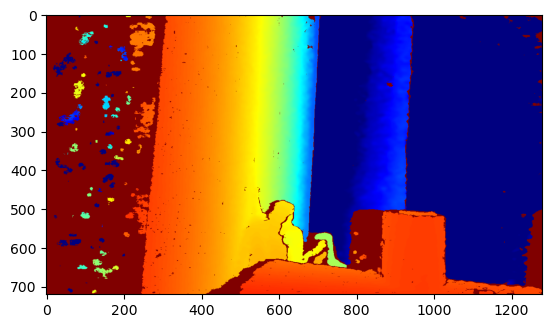

In [19]:
from matplotlib import pyplot as plt
colormap = cv2.applyColorMap(cv2.convertScaleAbs(depth_image1, alpha=0.1), cv2.COLORMAP_JET)
plt.imshow(colormap)

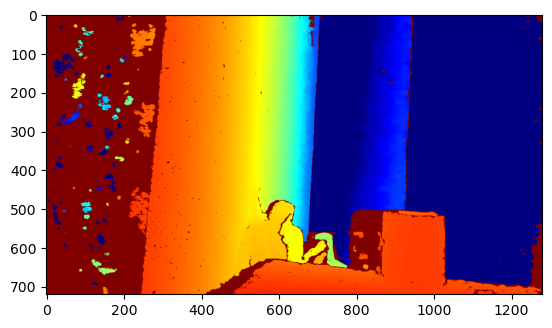

In [21]:
colormap2 = cv2.applyColorMap(cv2.convertScaleAbs(data, alpha=0.1), cv2.COLORMAP_JET)
plt.imshow(colormap2)